In [ ]:
# End-toend Multi-class Dog Breed Classification

# End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.12 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given a picture of a dog.

## 2. Data

The data is from Kaggle's dog breed identification competition: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

Evaluated on Multi Class Log Loss between the predicted probability and the observed target.

## 4. Features

* Dealing with images (unstructured data), use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* ~10000 unique images in the training set with labels
* ~10000 unique images in the test set with no labels


In [ ]:
# unzip file
# !unzip "/content/drive/MyDrive/Google Colab/Data Sets/DogVision/dog-breed-identification.zip"

# Prepare Workpace

In [ ]:
# Import necessary tools
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn. model_selection import train_test_split
from matplotlib.pyplot import imread
import datetime

import tensorflow as tf
import tensorflow_hub as hub
print ("TF version: ", tf.__version__)
print ("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version:  2.12.0
TF Hub version:  0.14.0
GPU available


## Getting our data ready (turning into Tensors or numerical format)

In [ ]:
# Checkout the labels of our data
labels_csv = pd.read_csv("drive/MyDrive/Google Colab/Data Sets/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

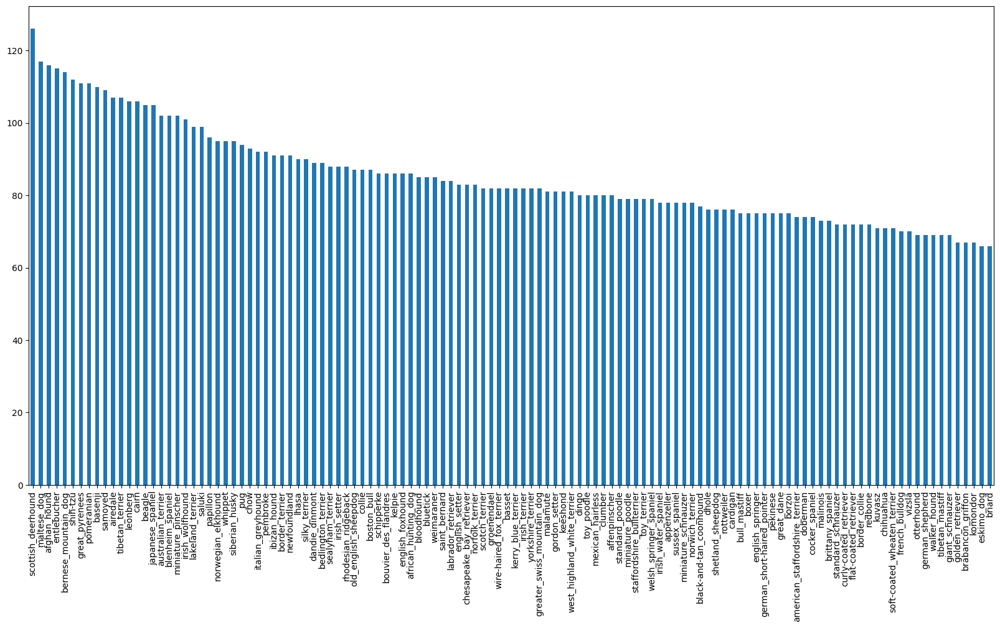

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
# What's the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

## Getting images and their labels

create a list of filename paths

In [ ]:
# Create pathnames from image IDs
filenames = ["drive/MyDrive/Google Colab/Data Sets/DogVision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Google Colab/Data Sets/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Google Colab/Data Sets/DogVision/train/")) == len(filenames):
  print("Filenames length matches # of images")
  print(len(os.listdir("drive/MyDrive/Google Colab/Data Sets/DogVision/train/")))
  print(len(filenames))
else:
  print("Filenames length does not match # of images")
  print(len(os.listdir("drive/MyDrive/Google Colab/Data Sets/DogVision/train/")))
  print(len(filenames))

Filenames length matches # of images
10222
10222


In [ ]:
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Filenames length matches length of labels")
  print(len(labels))
  print(len(filenames))
else:
  print("Filenames length does not match length of labels")
  print(len(labels))
  print(len(filenames))

Filenames length matches length of labels
10222
10222


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

## Creating a validation set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

Experimentation will begin with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 10000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Split data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(8000, 8000, 2000, 2000)

## Preprocessing Images (turning images into Tensors)

Going to write a function that:
* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable `image`
* Convert color values from 0-255 to 0-1 at the same scale
* Turn our `image` (a jpg) into Tensors
* Resize the `image` to be a shape of (224, 224)
* Return the modified `image`

In [ ]:
# Define image size
IMG_SIZE = 224 #@param {type:"slider", min:224, max:2240, step:224}

# Create function to preprocess data
def process_image(image_path):
  """
  Takes an image file path and turn the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerial Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to desired value
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches (32 is standard size)

batch size adjusts for memory available

data needs to be in the form of Tensor tuples which look like this: `(image, label)`


In [ ]:
# Create a simple function to return a tuble (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label


Create a function batch the data for processing

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs. Shuffles, the data if it's training data, but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels.)
  """
  # If the data is a test dataset, will not have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a validation dataset, will not need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # Create training batches
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor is faster than shuffling later
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples (this also turn the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Need to visualize the data as it is difficult to understand

In [ ]:
# Create a function for ciewing images in a data batch
def show_25_images(image, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 row, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(image[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())

len(train_images), len(train_labels)

(32, 32)

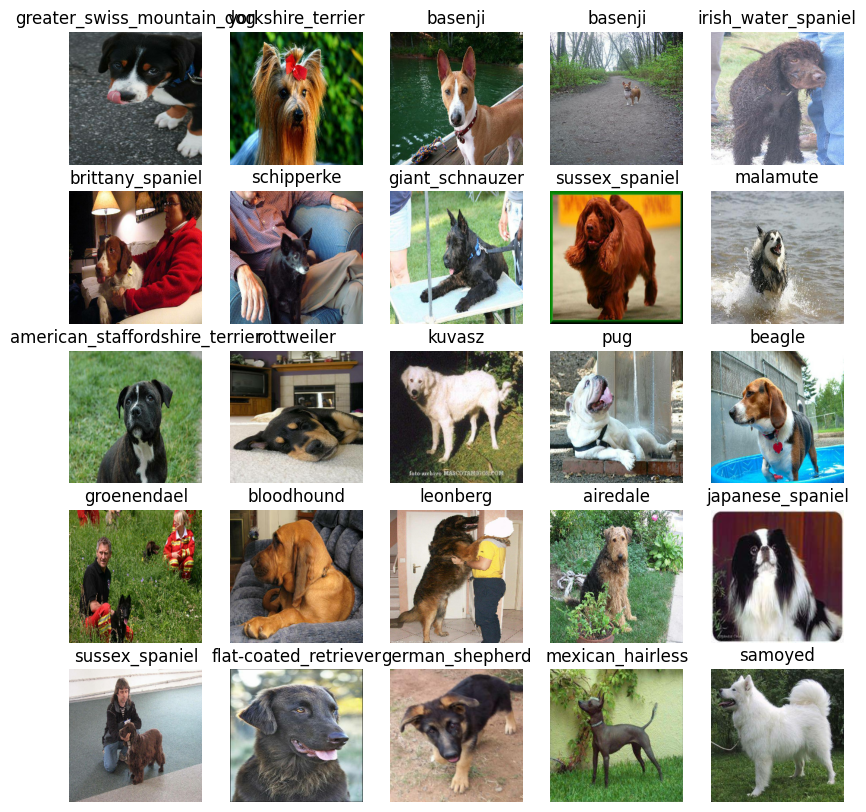

In [ ]:
# Visualize the data in a training batch
show_25_images(train_images, train_labels)

## Building a model

Before a model is built, a few things need to be defined:
* The input shape (image shape, in the form of Tensors) to the model.
* The output shape (image labels, in the form of Tensors) of the model.
* The URL of the model we want to use: https://colab.research.google.com/drive/1o7sSQ27TsdLQ8aPhanwoGspot8d__kpI#scrollTo=eSrFE_bjIWHG

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now there are inputs, outputs and model ready to go, combine them together into a Kera deep learning model.

Need to create a function which:
* Takes the input shape, outputs shape and the model chosen as paramters.
* Defines the layers in a Keras model in sequential fashion (do this first, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting)
* Returns the model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper functions a model can use during the training to do such things as save its progress, check its progress or stop training early if a model stops improving

Need to create two callbacks, one for TensorBoard which helps track the models progress and another for early stopping which prevents the model from training for too long.

TensorBoard Callback
To setup a TensorBoard callback, will need to do 3 things:
1. Load the TensorBoard notebook extenstion
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to the model's `fit()` funtion
3. Visualize the models training logs with the `%tensorboard` magic function (we'll do this after model training)

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Google Colab/Data Sets/DogVision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on a subset of data)
The first model is only going to train on 1000 images, to make sure everything is working, later the code will be adjusted and run the full model

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Let's create a function which trains a model

* Create a model using `create_modl()~
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on the model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks used
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model = create_model()

  # Create new TensorBoard session everytime model is trained
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model



In [ ]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
250/250 [==============================] - 148s 451ms/step - loss: 1.5129 - accuracy: 0.6325 - val_loss: 0.6998 - val_accuracy: 0.7910
Epoch 2/100
250/250 [==============================] - 34s 136ms/step - loss: 0.4092 - accuracy: 0.8811 - val_loss: 0.6629 - val_accuracy: 0.7935
Epoch 3/100
250/250 [==============================] - 37s 148ms/step - loss: 0.2290 - accuracy: 0.9433 - val_loss: 0.6350 - val_accuracy: 0.8055
Epoch 4/100
250/250 [==============================] - 35s 139ms/step - loss: 0.1454 - accuracy: 0.9706 - val_loss: 0.6475 - val_accuracy: 0.8020
Epoch 5/100
250/250 [==============================] - 33s 132ms/step - loss: 0.0971 - accuracy: 0.9843 - val_loss: 0.6574 - val_accuracy: 0.8110
Epoch 6/100
250/250 [==============================] - 37s 149ms/step - loss: 0.0705 - accuracy: 0.9909 - val_loss: 0.6593 - val_accuracy: 0.8070
Epoch 7/100
250/250 [========

## Checking the TensorBoard logs

The TensorBoard magic Function (`%tensorboard`) will access the logs directly created earlier and visualize it's contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Google\ Colab/Data\ Sets/DogVision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predicitons using a trained model

In [ ]:
preds = model.predict(val_data, verbose=1)
preds

63/63 [==============================] - 48s 125ms/step


array([[3.8200421e-09, 6.1034143e-11, 9.0579017e-10, ..., 1.3539962e-09,
        2.9585975e-08, 8.6491751e-11],
       [7.2969374e-07, 1.5864664e-07, 5.7535643e-10, ..., 8.9467012e-10,
        3.6231687e-09, 9.2160199e-08],
       [3.1774220e-04, 1.2171727e-05, 3.0448173e-05, ..., 3.0751917e-06,
        1.3814338e-04, 1.3886127e-03],
       ...,
       [1.3816833e-04, 1.3116137e-05, 2.6158850e-06, ..., 1.6825335e-05,
        2.6020329e-05, 1.0174860e-02],
       [1.9423341e-08, 5.2325997e-09, 1.6603330e-09, ..., 5.7025261e-08,
        1.5421376e-05, 9.1676942e-09],
       [1.3796500e-07, 3.0304764e-05, 1.2220543e-10, ..., 6.3888734e-09,
        2.4918668e-06, 5.8301121e-06]], dtype=float32)

In [ ]:
preds.shape

(2000, 120)

In [ ]:
np.sum(preds[0])

1.0

In [ ]:
# First prediction
index = 0
print(preds[index])
print(f"Max value (probablity of predicition): {np.max(preds[index])}")
print(f"Sum: {np.sum(preds[index])}")
print(f"Max index: {np.argmax(preds[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(preds[index])]}")

[3.82004206e-09 6.10341430e-11 9.05790165e-10 8.41527648e-09
 2.01738530e-07 4.08749329e-04 7.61342367e-09 9.83289397e-07
 2.60767208e-09 4.43373392e-06 4.58629801e-09 1.39446513e-07
 4.45902117e-07 3.73434883e-09 3.64088493e-09 1.34785034e-06
 2.61025104e-08 1.51075490e-08 4.64862260e-10 2.75809864e-09
 8.59236501e-11 1.08336340e-09 2.15140039e-09 4.35890248e-11
 1.07872921e-07 1.89328819e-09 5.20855130e-11 6.03735462e-09
 8.46834269e-10 2.08760431e-09 2.31148017e-10 3.35491940e-10
 1.45350312e-11 1.07732590e-09 4.50276616e-09 4.89525487e-09
 1.65364451e-08 2.74893247e-10 9.26475252e-09 8.88037334e-07
 3.55214191e-10 6.29560779e-11 9.99562085e-01 1.21209327e-08
 7.35737790e-11 1.71775608e-10 1.32344538e-10 9.07569686e-10
 1.51731527e-09 7.31386340e-11 8.19331492e-10 2.36914516e-10
 2.17884030e-10 1.20283585e-05 1.66935812e-10 3.18115454e-08
 2.81929008e-10 1.02152670e-11 1.49075301e-11 4.53346631e-11
 2.33672659e-09 6.09762836e-08 4.47239364e-11 9.27721899e-09
 5.16292031e-09 1.920855

Having the above functionality is great, but I want to be able to do it at scale and it would be evenbetter if I could see the image the predicition is being made on!

NOTE: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediciton probabilities into thier respective label
def get_pred_label(predicition_probabilities):
  """
  Turns an array of prediciton probabilities into a label.
  """
  return unique_breeds[np.argmax(predicition_probabilities)]

# Get a predicted label based on an array of prediciton probabilities
pred_label = get_pred_label(preds[81])
pred_label

'lakeland_terrier'

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.96884924, 0.9701885 , 0.6773138 ],
         [0.9649684 , 0.9649684 , 0.6752449 ],
         [0.97255224, 0.97255224, 0.6897149 ],
         ...,
         [0.94544876, 0.93533266, 0.63851905],
         [0.9122807 , 0.90027964, 0.59165734],
         [0.6266023 , 0.6167168 , 0.30141547]],
 
        [[0.9636907 , 0.9677085 , 0.69290984],
         [0.97148985, 0.97514886, 0.7090773 ],
         [0.9998248 , 0.99992114, 0.74782914],
         ...,
         [0.97280353, 0.9686894 , 0.715118  ],
         [0.9849285 , 0.99132735, 0.7000457 ],
         [0.8505023 , 0.8618907 , 0.55982476]],
 
        [[0.94763345, 0.9589167 , 0.70516145],
         [0.96966976, 0.9795524 , 0.73575866],
         [0.9953722 , 0.99858195, 0.7804973 ],
         ...,
         [0.8728771 , 0.8872267 , 0.69398195],
         [0.8451019 , 0.8824005 , 0.6274633 ],
         [0.7930096 , 0.83910555, 0.5551244 ]],
 
        ...,
 
        [[0.47171637, 0.37899917, 0.3959688 ],
         [0.23060554, 0.1464493 , 0.15993

Now ways have been generated to get:
* Prediciton labels
* Validation labels (truth labels)
* Validation images

Now to make some function to visualize

Create a function which:
* Takes an array of prediction probabilites, an array of truth labels and an array of images and integers.
* Convert the prediciton probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

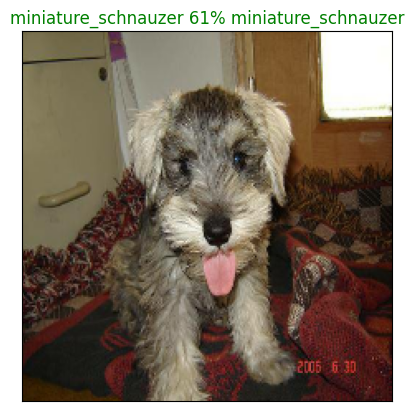

In [ ]:
plot_pred(prediction_probabilities=preds,
          labels=val_labels,
          images=val_images,
          n=77)

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10
    * Prediction probability indexes
    * Prediction probability values
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  """

  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")


  # Change color of the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

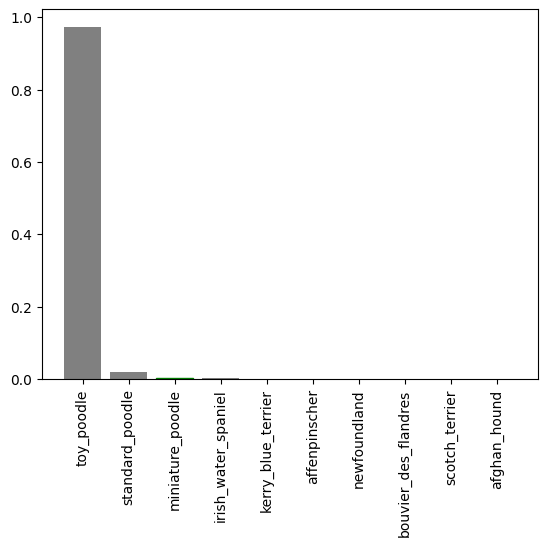

In [ ]:
plot_pred_conf(prediction_probabilities=preds, labels=val_labels, n=9)

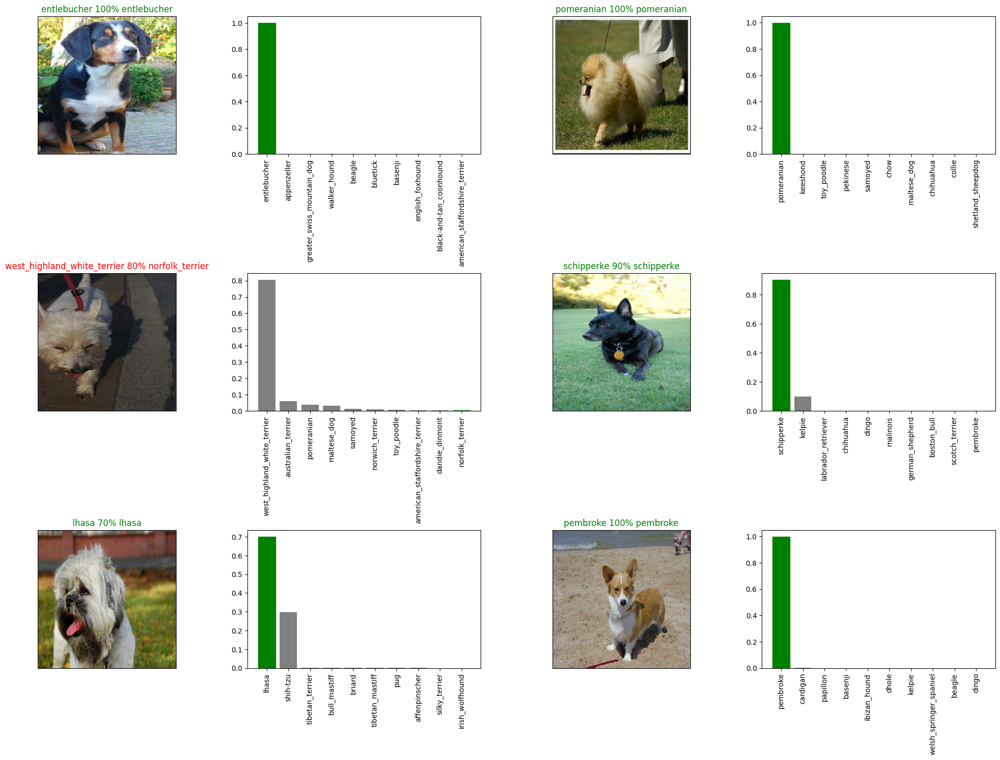

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=preds,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=preds,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

How to create a confusion matrix

## Saving and reloading progress

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Google Colab/Data Sets/DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model
save_model(model, suffix="10222-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Google Colab/Data Sets/DogVision/models/20230903-02341693708448-10222-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Google Colab/Data Sets/DogVision/models/20230903-02341693708448-10222-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_full_model = load_model('drive/MyDrive/Google Colab/Data Sets/DogVision/models/20230903-02341693708448-10222-images-mobilenetv2-Adam.h5')

Loading saved model from drive/MyDrive/Google Colab/Data Sets/DogVision/models/20230903-02341693708448-10222-images-mobilenetv2-Adam.h5...


In [ ]:
model.evaluate(val_data)

63/63 [==============================] - 6s 99ms/step - loss: 0.6759 - accuracy: 0.8050


[0.6759336590766907, 0.8050000071525574]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

63/63 [==============================] - 7s 99ms/step - loss: 1.2588 - accuracy: 0.6750


[1.2587732076644897, 0.675000011920929]

## Making predicitons on the test data

Since the model has been trained on images in the form of Tensor batches, to make predictions on the test data, it must be the same format.

`create_data_batches` was created earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting `test_data` paramter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to `predict90` method called on the model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Google Colab/Data Sets/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Google Colab/Data Sets/DogVision/test/df0063da2179d3ac623296f2c164aeb6.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/e19900119c7d3ce48d4035cd0211be72.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/e0295b9b1bee725d52d74f9af84092cf.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/e4f8465214c9644b10c536ecb087b7be.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/e6af47e8b6973c8f8d2b9fd5af94c54d.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/dd539ec1933bc47bc80b1447a26aef45.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/df86ba50c4d0b597af0d23bda37eb10e.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/test/e1cad2c1658b4a81db4750218a1f57d2.jpg']

In [ ]:
len(test_filenames)

9324

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note** Calling `predict()` on our full model and passing it the test data batch will take a long time to run

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

292/292 [==============================] - 891s 3s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Google Colab/Data Sets/DogVision/preds_array_fullmodel.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Google Colab/Data Sets/DogVision/preds_array_fullmodel.csv", delimiter=",")

In [ ]:
test_predictions.shape

(9324, 120)

## Preparing test dataset predictions for Kaggle

Looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities to each of the dog breed columns.
* Export the DataFrame as as CSV to submit it to Kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df0063da2179d3ac623296f2c164aeb6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e19900119c7d3ce48d4035cd0211be72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e0295b9b1bee725d52d74f9af84092cf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dea5b2d047b3cb7ce13234140c7bf5aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4f8465214c9644b10c536ecb087b7be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probailities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,df0063da2179d3ac623296f2c164aeb6,8.258353e-07,5.595336e-07,6.871665e-07,1.666711e-06,4.348938e-05,8.052089e-04,3.992904e-05,1.900160e-04,3.595711e-06,...,6.584673e-07,5.982358e-05,4.472090e-08,8.545248e-05,5.180654e-08,5.127604e-02,6.125385e-04,9.270499e-07,9.863767e-05,7.444777e-06
1,e19900119c7d3ce48d4035cd0211be72,8.205824e-09,1.749413e-08,1.526965e-09,6.041800e-08,2.696354e-07,2.642161e-07,7.356822e-08,1.191081e-07,7.093296e-06,...,2.211772e-09,1.628484e-08,1.038010e-08,1.921705e-07,3.676112e-10,3.059965e-04,1.347868e-09,4.634866e-08,1.152260e-07,1.654873e-09
2,e0295b9b1bee725d52d74f9af84092cf,4.787728e-07,2.766085e-05,1.115724e-07,4.534857e-06,1.393467e-07,4.040968e-07,1.285677e-05,1.147478e-09,8.086866e-09,...,1.897835e-08,2.140631e-07,1.153548e-09,7.155352e-06,8.979836e-05,3.361220e-09,6.641058e-07,1.509543e-05,8.786318e-05,6.658371e-07
3,dea5b2d047b3cb7ce13234140c7bf5aa,1.724644e-06,1.030632e-07,8.003251e-06,4.948096e-05,1.622368e-05,1.581759e-04,3.116418e-07,8.071195e-07,2.356120e-06,...,2.977469e-08,5.284720e-07,2.566852e-07,6.009228e-06,3.369623e-05,1.327349e-07,1.422799e-03,1.399074e-02,5.089355e-02,3.345118e-06
4,e4f8465214c9644b10c536ecb087b7be,1.142477e-06,3.055249e-06,1.135557e-06,1.695466e-05,5.636257e-08,2.104110e-04,4.443880e-09,1.247651e-08,2.271760e-09,...,1.724757e-09,1.128478e-07,2.128463e-09,2.559200e-07,2.139601e-05,5.158741e-08,1.079056e-08,3.575005e-06,3.480396e-05,2.047912e-08


In [ ]:
# export predictions DataFrameto csv
preds_df.to_csv("drive/MyDrive/Google Colab/Data Sets/DogVision/full_model_predictions_submission_1_mobilenetv2.csv", index=False)

## Making predictions on custom images

To make predictions on custom images, we'll
* Get the filepaths of new images
* Turn the filepaths into data batches using `create_data_batches()` and since our custom custom images won't have laebls, we set the `test_data` parameter to `True`
* Pass the custom image data batch to our model' `predict` method
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images


In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Google Colab/Data Sets/DogVision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Google Colab/Data Sets/DogVision/my-dog-photos/funny-portrait-of-cute-corgi-dog-outdoors-free-photo.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/my-dog-photos/gettyimages-837898820-1-4deae142d4d0403dbb6cb542bfc56934.jpg',
 'drive/MyDrive/Google Colab/Data Sets/DogVision/my-dog-photos/201030094143-stock-rhodesian-ridgeback.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches (custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pembroke', 'golden_retriever', 'vizsla']

In [ ]:
# Get custom images (unbatchify() fucntion won't work since there aren't labels...)
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

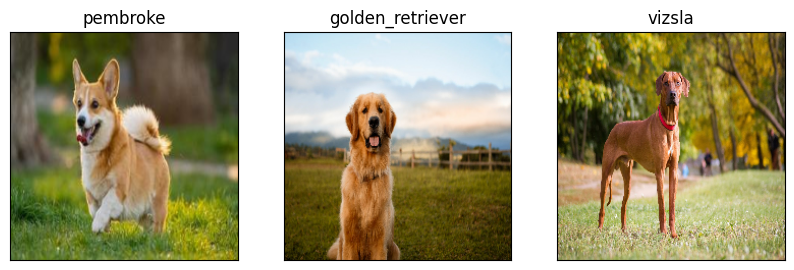

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)